In [1]:
!apt-get install p7zip-full

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
p7zip-full is already the newest version (16.02+dfsg-8).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [2]:
!gdown https://drive.google.com/u/0/uc?id=18dPYDLDKxZ_1EBGnZ4KFdlI2ApRp_erE

Downloading...
From (original): https://drive.google.com/u/0/uc?id=18dPYDLDKxZ_1EBGnZ4KFdlI2ApRp_erE
From (redirected): https://drive.google.com/uc?id=18dPYDLDKxZ_1EBGnZ4KFdlI2ApRp_erE&confirm=t&uuid=46484fa1-7199-42e0-937d-4ab17e58bbc5
To: /content/demo_dataset.7z
100% 8.59G/8.59G [02:11<00:00, 65.2MB/s]


In [3]:
!7z x demo_dataset.7z


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan         1 file, 8594968063 bytes (8197 MiB)

Extracting archive: demo_dataset.7z
--
Path = demo_dataset.7z
Type = 7z
Physical Size = 8594968063
Headers Size = 296023
Method = LZMA2:24
Solid = +
Blocks = 3

  0%      0% 10 - train/000034_Pheonix_33.46105_-112.13186.png                                                        0% 18 - train/000050_Houston_29.74772_-95.54948.png                                                       0% 23 - train/000059_Chicago_41.94177_-87.80561.png

In [ ]:
# !pip install albumentations

In [1]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch.nn.functional as F
import torch.nn as nn

device = "cuda" if torch.cuda.is_available() else "cpu"

In [34]:
class ImageFolderDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.folder_path = folder_path
        self.transform = transform
        self.image_files = [f for f in os.listdir(folder_path) if f.endswith(".png")]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.folder_path, self.image_files[idx])
        image = Image.open(img_path)
        width, height = image.size
        half_width = width // 2
        left_image = image.crop((0, 0, half_width, height))
        right_image = image.crop((half_width, 0, width, height))

        if self.transform:
            transformed = self.transform(image=np.array(left_image), image0=np.array(right_image))
            left_image, right_image = transformed['image'], transformed['image0']

        return left_image, right_image


In [35]:
def normalize(x, **kwargs):
    return ((x / 127.5) - 1).astype(np.float32)

def denormalize(x, **kwargs):
    return torch.clamp(((x * 255) + 255) / 2, 0, 255).to(torch.uint8)

In [67]:
batch_size = 10

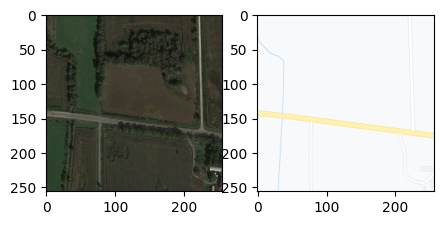

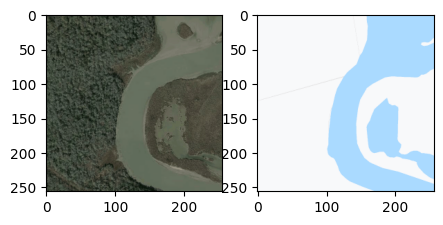

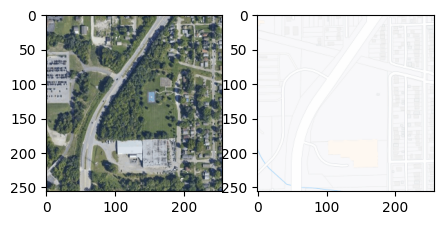

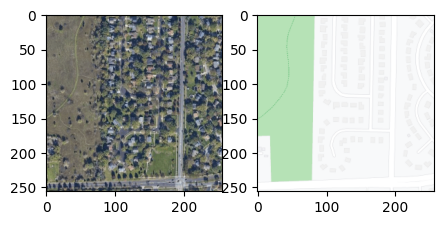

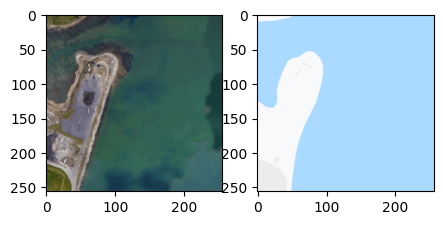

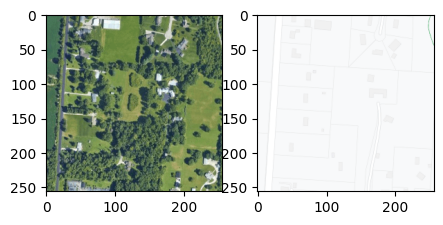

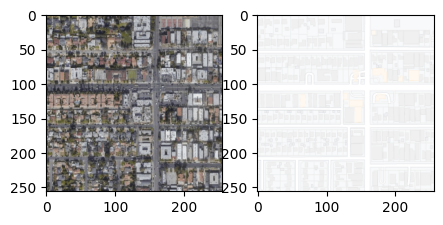

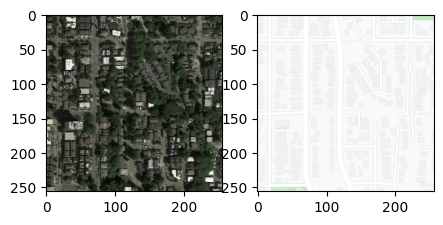

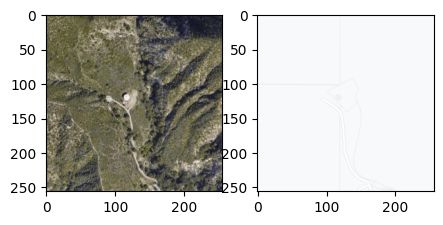

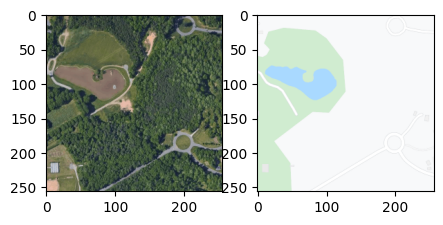

In [68]:
folder_path = 'train'

# https://albumentations.ai/docs/api_reference/augmentations/
transform = A.Compose([
    # A.ColorJitter(p=0.3),
    A.Resize(256, 256),
    # A.Rotate(limit=40),
    A.Lambda(image=normalize),
    ToTensorV2(),
], additional_targets={'image0': 'image'})


dataset = ImageFolderDataset(folder_path, transform=transform)

dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

def show_images(left_image, right_image):

    for i, (left_img, right_img) in enumerate(zip(left_image, right_image)):
        fig = plt.figure(figsize=(5, 5))
        ax1 = fig.add_subplot(121)
        ax2 = fig.add_subplot(122)
        left_img = left_img.permute(1, 2, 0)
        right_img = right_img.permute(1, 2, 0)
        ax1.imshow(left_img)
        ax2.imshow(right_img)

for images in dataloader:
    left_images, right_images = images
    left_images = denormalize(left_images)
    right_images = denormalize(right_images)
    show_images(left_images, right_images)
    break


In [2]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.layers = nn.Sequential(
            # Input is (3, 256, 256)
            nn.Conv2d(3, 64, kernel_size=7, stride=1, padding=3), # (64, 256, 256)
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1), # (128, 256, 256)
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1), # (256, 256, 256)
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1), # (512, 256, 256)
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1), # (512, 256, 256)
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1), # (512, 256, 256)
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=1), # (256, 256, 256)
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1), # (128, 256, 256)
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1), # (64, 256, 256)
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 3, kernel_size=7, stride=1, padding=3), # (3, 256, 256)
            nn.Tanh()

        )

    def forward(self, input):
        return self.layers(input)

In [3]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.layers = nn.Sequential(
            # Input is 6 x 256 x 256 (real image + generated image)
            nn.Conv2d(6, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )


    def forward(self, input):
        return self.layers(input)

In [82]:
def style_loss(gen, target):
    gen_gram = gram_matrix(gen)
    target_gram = gram_matrix(target)
    return F.mse_loss(gen_gram, target_gram)

def gram_matrix(tensor):
    b, c, h, w = tensor.size()
    features = tensor.view(b, c, h * w)
    G = torch.bmm(features, features.transpose(1, 2))
    return G / (c * h * w)

def generator_loss(disc_generated_output, gen_output, target, style_weight=1e5):
    gen_gan_loss = F.binary_cross_entropy(disc_generated_output, torch.ones_like(disc_generated_output))
    gen_l1_loss = F.l1_loss(gen_output, target)
    gen_style_loss = style_loss(gen_output, target)
    return gen_gan_loss + gen_l1_loss + style_weight * gen_style_loss

def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = F.binary_cross_entropy(disc_real_output, torch.ones_like(disc_real_output))
    generated_loss = F.binary_cross_entropy(disc_generated_output, torch.zeros_like(disc_generated_output))
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

In [5]:
G = Generator()
D = Discriminator()
G_optimizer = torch.optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))
D_optimizer = torch.optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))

Generator(
  (layers): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (10): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): ReLU(inpl

In [93]:
epochs = 10

In [94]:
torch.cuda.empty_cache()


epoch 0

inside batch 0


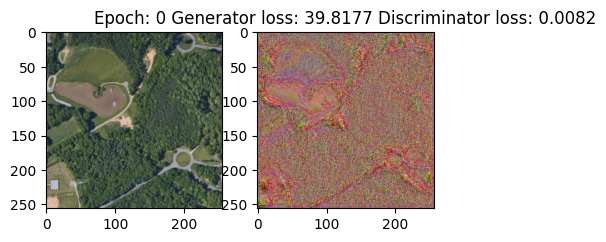

inside batch 1
inside batch 2
inside batch 3
inside batch 4
inside batch 5
inside batch 6
inside batch 7
inside batch 8
inside batch 9
inside batch 10


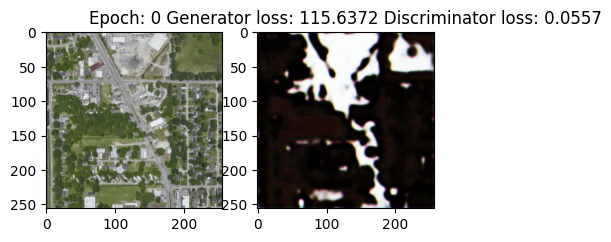

inside batch 11
inside batch 12
inside batch 13
inside batch 14
inside batch 15
inside batch 16
inside batch 17
inside batch 18
inside batch 19
inside batch 20


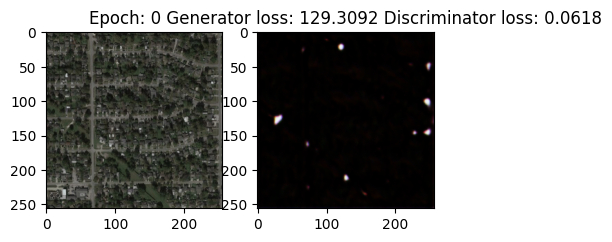

inside batch 21
inside batch 22
inside batch 23
inside batch 24
inside batch 25
inside batch 26
inside batch 27
inside batch 28
inside batch 29
inside batch 30


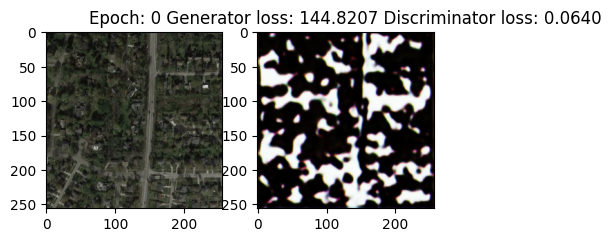

inside batch 31
inside batch 32
inside batch 33
inside batch 34
inside batch 35
inside batch 36
inside batch 37
inside batch 38
inside batch 39
inside batch 40


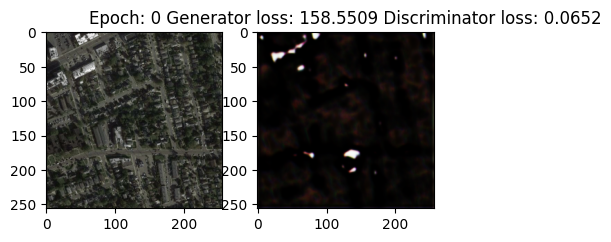

inside batch 41
inside batch 42
inside batch 43
inside batch 44
inside batch 45
inside batch 46
inside batch 47
inside batch 48
inside batch 49
inside batch 50


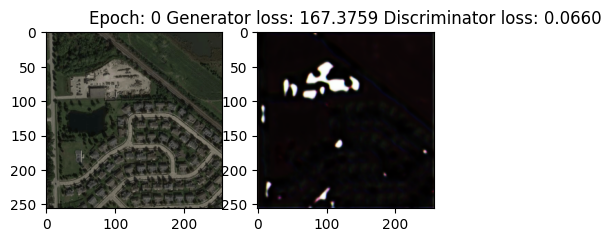

inside batch 51
inside batch 52
inside batch 53
inside batch 54
inside batch 55
inside batch 56
inside batch 57
inside batch 58
inside batch 59
inside batch 60


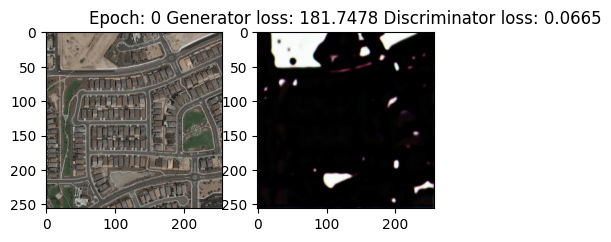

inside batch 61
inside batch 62
inside batch 63
inside batch 64
inside batch 65
inside batch 66
inside batch 67
inside batch 68
inside batch 69
inside batch 70


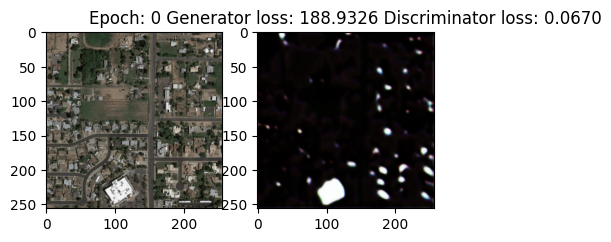

inside batch 71
inside batch 72
inside batch 73
inside batch 74
inside batch 75
inside batch 76
inside batch 77
inside batch 78
inside batch 79
inside batch 80


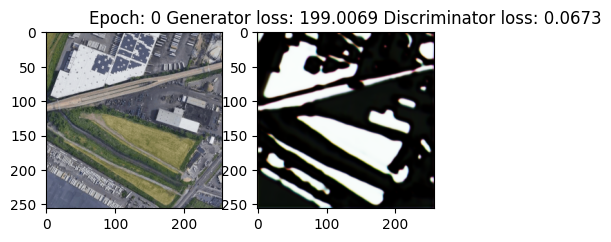

inside batch 81
inside batch 82
inside batch 83
inside batch 84
inside batch 85
inside batch 86
inside batch 87
inside batch 88
inside batch 89
inside batch 90


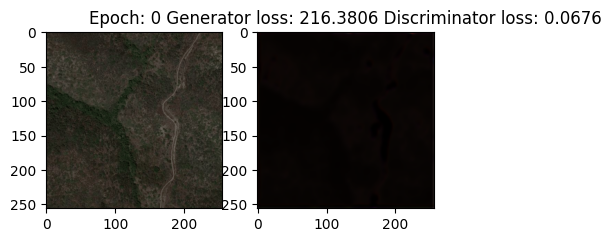

inside batch 91
inside batch 92
inside batch 93
inside batch 94
inside batch 95
inside batch 96
inside batch 97
inside batch 98
inside batch 99
inside batch 100


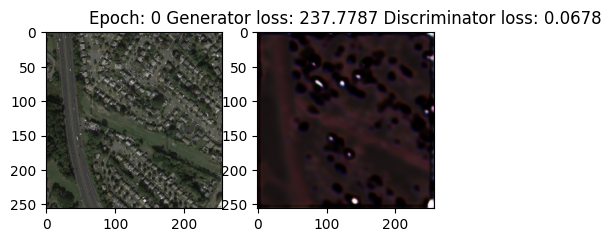

inside batch 101
inside batch 102
inside batch 103
inside batch 104
inside batch 105
inside batch 106
inside batch 107
inside batch 108
inside batch 109
inside batch 110


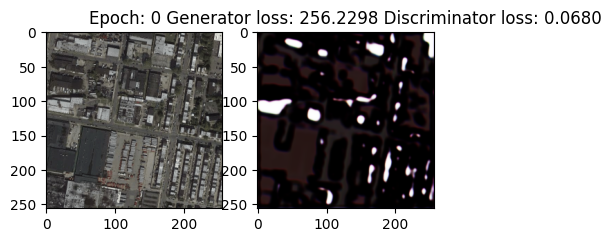

inside batch 111
inside batch 112
inside batch 113
inside batch 114
inside batch 115
inside batch 116
inside batch 117
inside batch 118
inside batch 119
inside batch 120


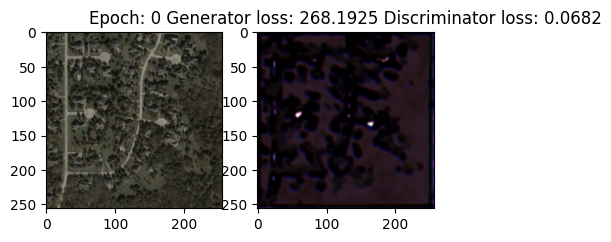

inside batch 121
inside batch 122
inside batch 123
inside batch 124
inside batch 125
inside batch 126
inside batch 127
inside batch 128
inside batch 129
inside batch 130


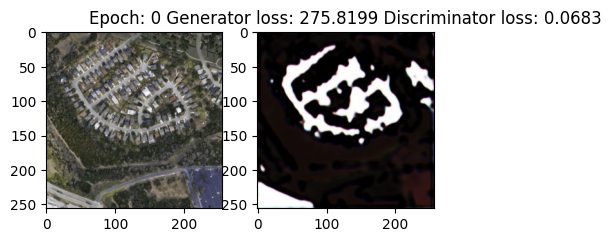

inside batch 131
inside batch 132
inside batch 133
inside batch 134
inside batch 135
inside batch 136
inside batch 137
inside batch 138
inside batch 139
inside batch 140


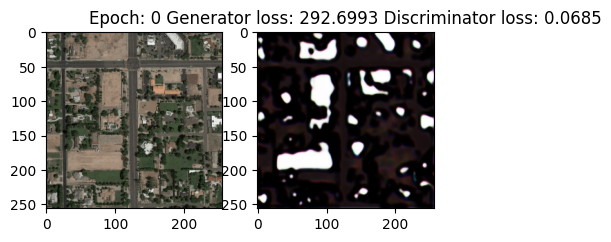

inside batch 141
inside batch 142
inside batch 143
inside batch 144
inside batch 145
inside batch 146
inside batch 147
inside batch 148
inside batch 149
inside batch 150


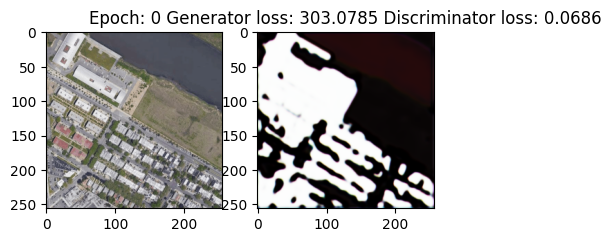

inside batch 151
inside batch 152
inside batch 153
inside batch 154
inside batch 155
inside batch 156
inside batch 157
inside batch 158
inside batch 159
inside batch 160


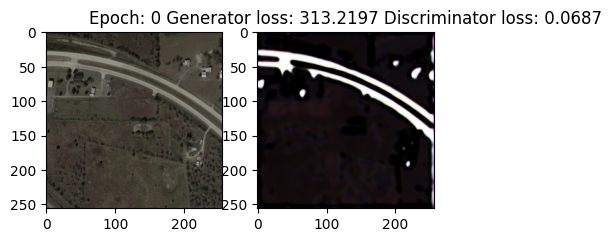

inside batch 161
inside batch 162
inside batch 163
inside batch 164
inside batch 165
inside batch 166
inside batch 167
inside batch 168
inside batch 169
inside batch 170


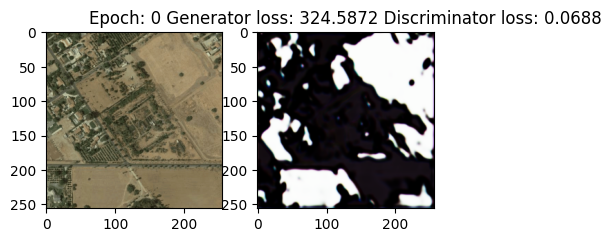

inside batch 171
inside batch 172
inside batch 173
inside batch 174
inside batch 175
inside batch 176
inside batch 177
inside batch 178
inside batch 179
inside batch 180


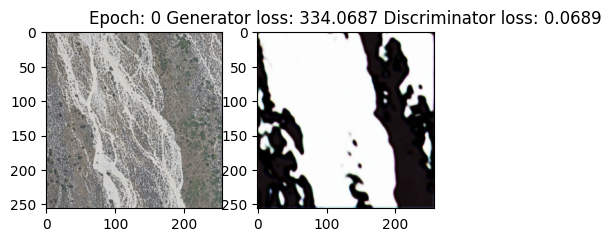

inside batch 181
inside batch 182
inside batch 183
inside batch 184
inside batch 185
inside batch 186
inside batch 187
inside batch 188
inside batch 189
inside batch 190


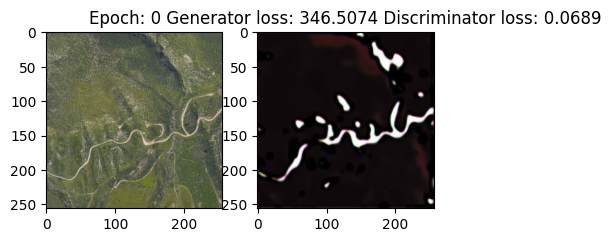

inside batch 191
inside batch 192
inside batch 193
inside batch 194
inside batch 195
inside batch 196
inside batch 197
inside batch 198
inside batch 199
inside batch 200


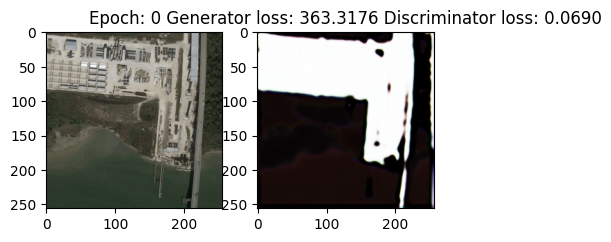

inside batch 201
inside batch 202
inside batch 203
inside batch 204
inside batch 205
inside batch 206
inside batch 207
inside batch 208
inside batch 209
inside batch 210


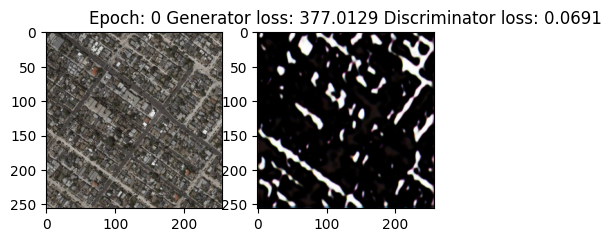

inside batch 211
inside batch 212
inside batch 213
inside batch 214
inside batch 215
inside batch 216
inside batch 217
inside batch 218
inside batch 219
inside batch 220


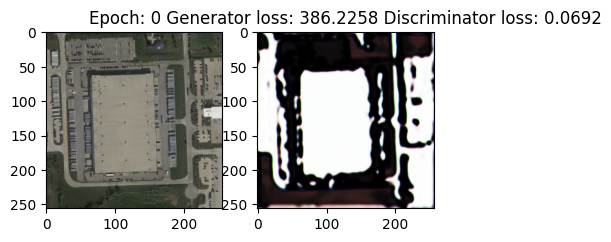

inside batch 221
inside batch 222
inside batch 223
inside batch 224
inside batch 225
inside batch 226
inside batch 227
inside batch 228
inside batch 229
inside batch 230


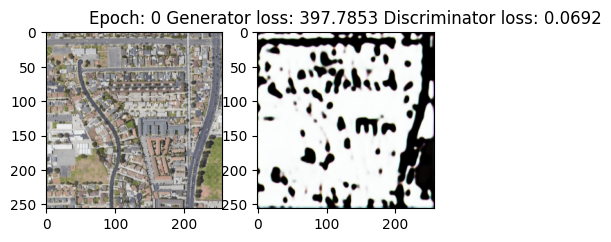

inside batch 231
inside batch 232
inside batch 233
inside batch 234
inside batch 235
inside batch 236
inside batch 237
inside batch 238
inside batch 239
inside batch 240


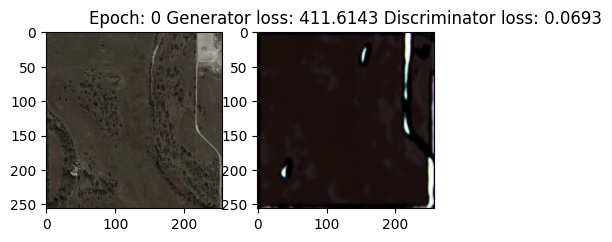

inside batch 241
inside batch 242
inside batch 243
inside batch 244
inside batch 245
inside batch 246
inside batch 247
inside batch 248
inside batch 249
inside batch 250


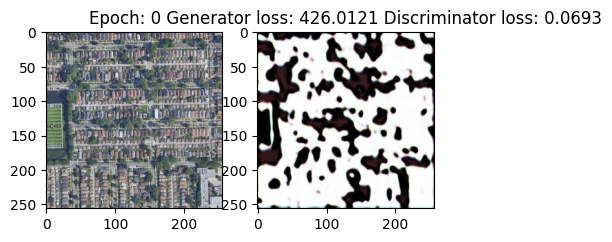

inside batch 251
inside batch 252
inside batch 253
inside batch 254
inside batch 255
inside batch 256
inside batch 257
inside batch 258
inside batch 259
inside batch 260


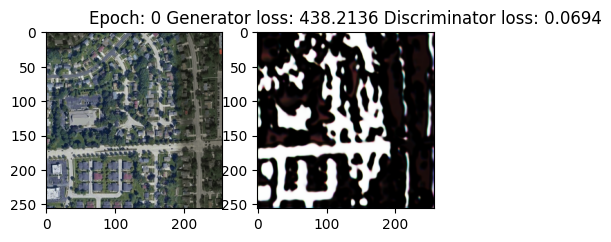

inside batch 261
inside batch 262
inside batch 263
inside batch 264
inside batch 265
inside batch 266
inside batch 267
inside batch 268
inside batch 269
inside batch 270


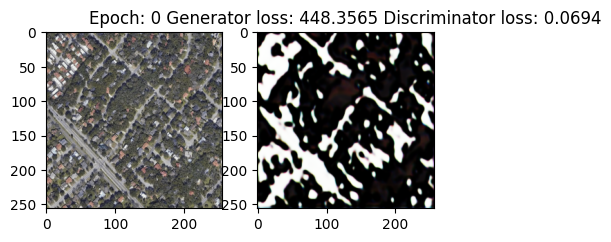

inside batch 271
inside batch 272
inside batch 273
inside batch 274
inside batch 275
inside batch 276
inside batch 277
inside batch 278
inside batch 279
inside batch 280


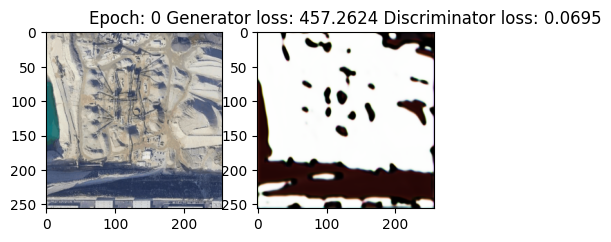

inside batch 281
inside batch 282
inside batch 283
inside batch 284
inside batch 285
inside batch 286
inside batch 287
inside batch 288
inside batch 289
inside batch 290


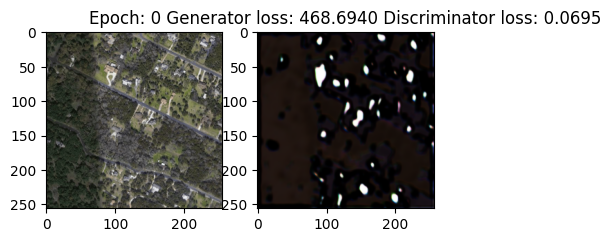

inside batch 291
inside batch 292
inside batch 293
inside batch 294
inside batch 295
inside batch 296
inside batch 297
inside batch 298
inside batch 299
inside batch 300


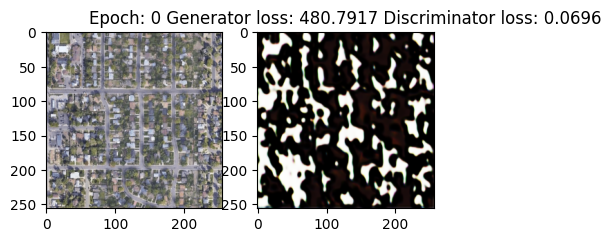

inside batch 301
inside batch 302
inside batch 303
inside batch 304
inside batch 305
inside batch 306
inside batch 307
inside batch 308
inside batch 309
inside batch 310


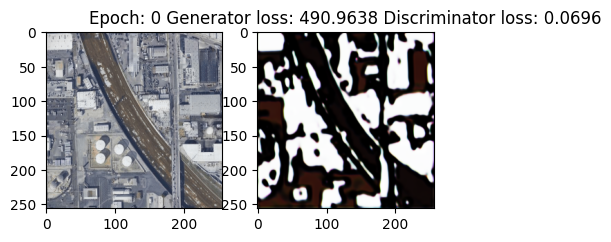

inside batch 311
inside batch 312
inside batch 313
inside batch 314
inside batch 315
inside batch 316
inside batch 317
inside batch 318
inside batch 319
inside batch 320


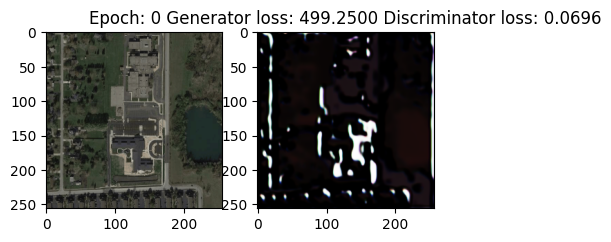

inside batch 321
inside batch 322
inside batch 323
inside batch 324
inside batch 325
inside batch 326
inside batch 327
inside batch 328
inside batch 329
inside batch 330


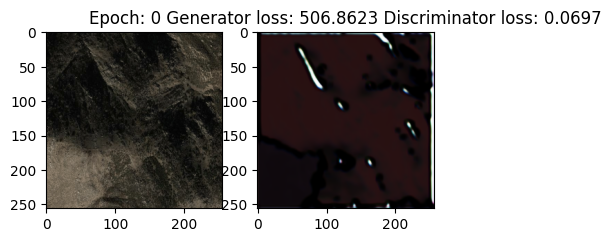

inside batch 331
inside batch 332
inside batch 333
inside batch 334
inside batch 335
inside batch 336
inside batch 337
inside batch 338
inside batch 339
inside batch 340


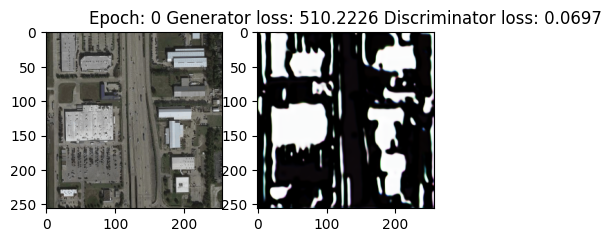

inside batch 341
inside batch 342
inside batch 343
inside batch 344
inside batch 345
inside batch 346
inside batch 347
inside batch 348
inside batch 349
inside batch 350


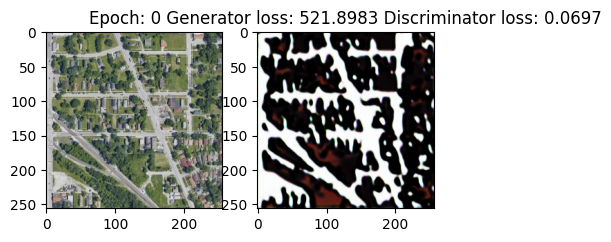

inside batch 351
inside batch 352
inside batch 353
inside batch 354
inside batch 355
inside batch 356
inside batch 357
inside batch 358
inside batch 359
inside batch 360


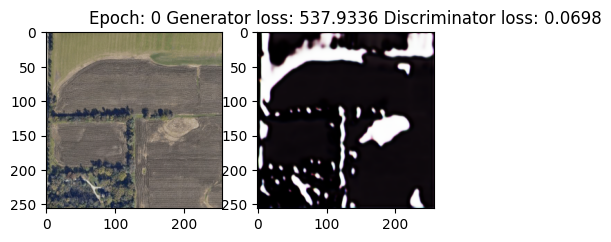

inside batch 361
inside batch 362
inside batch 363
inside batch 364
inside batch 365
inside batch 366
inside batch 367
inside batch 368
inside batch 369
inside batch 370


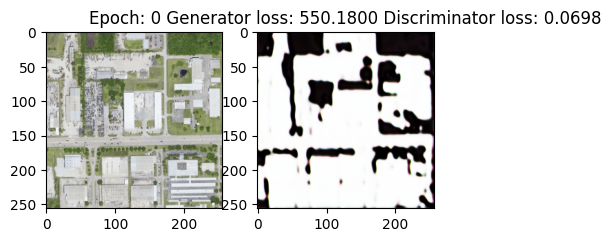

inside batch 371
inside batch 372
inside batch 373
inside batch 374
inside batch 375
inside batch 376
inside batch 377
inside batch 378
inside batch 379
inside batch 380


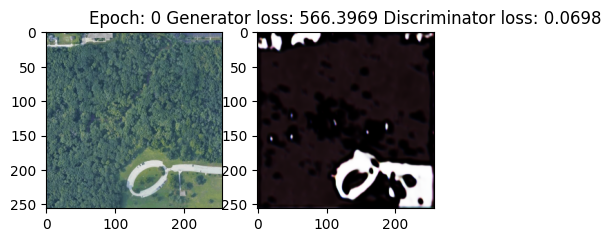

inside batch 381
inside batch 382
inside batch 383
inside batch 384
inside batch 385
inside batch 386
inside batch 387
inside batch 388
inside batch 389
inside batch 390


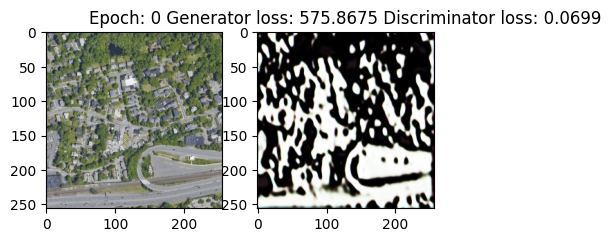

inside batch 391
inside batch 392
inside batch 393
inside batch 394
inside batch 395
inside batch 396
inside batch 397
inside batch 398
inside batch 399
inside batch 400


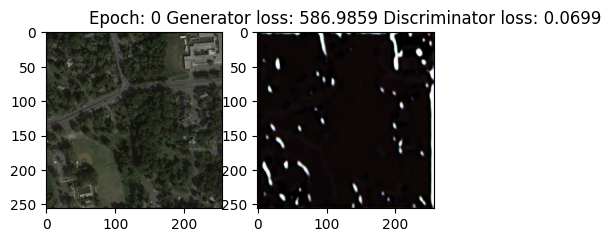

inside batch 401
inside batch 402
inside batch 403
inside batch 404
inside batch 405
inside batch 406
inside batch 407
inside batch 408
inside batch 409
inside batch 410


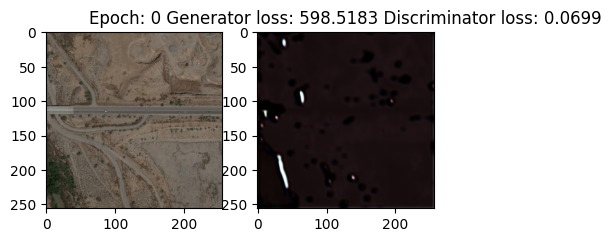

inside batch 411
inside batch 412
inside batch 413
inside batch 414
inside batch 415
inside batch 416
inside batch 417
inside batch 418
inside batch 419
inside batch 420


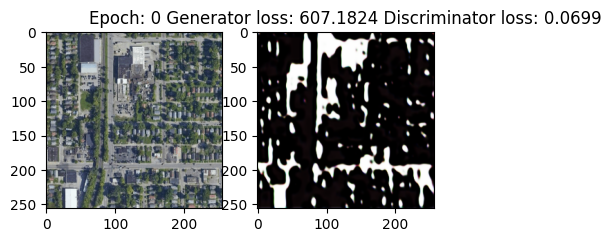

inside batch 421
inside batch 422
inside batch 423
inside batch 424
inside batch 425
inside batch 426
inside batch 427
inside batch 428
inside batch 429
inside batch 430


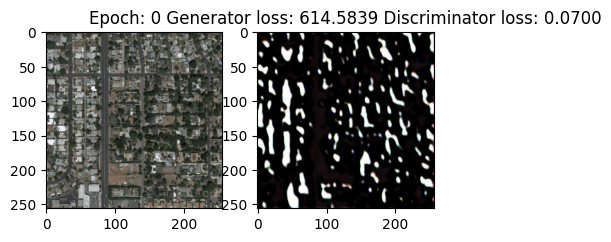

inside batch 431
inside batch 432
inside batch 433
inside batch 434
inside batch 435
inside batch 436
inside batch 437
inside batch 438
inside batch 439
inside batch 440


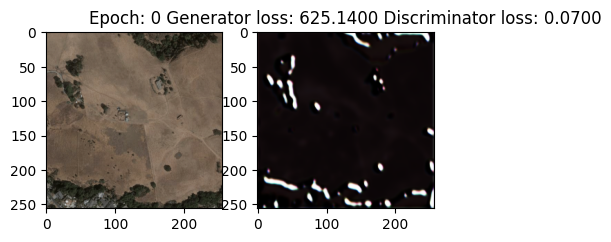

inside batch 441
inside batch 442
inside batch 443
inside batch 444
inside batch 445
inside batch 446
inside batch 447
inside batch 448
inside batch 449
inside batch 450


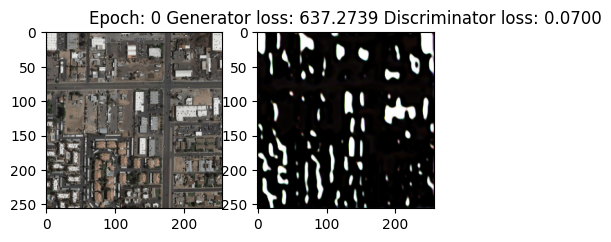

inside batch 451
inside batch 452
inside batch 453
inside batch 454
inside batch 455
inside batch 456
inside batch 457
inside batch 458
inside batch 459
inside batch 460


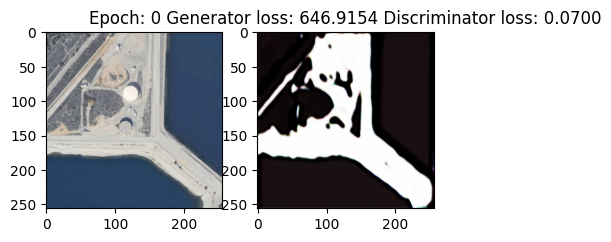

inside batch 461
inside batch 462
inside batch 463
inside batch 464
inside batch 465
inside batch 466
inside batch 467
inside batch 468
inside batch 469
inside batch 470


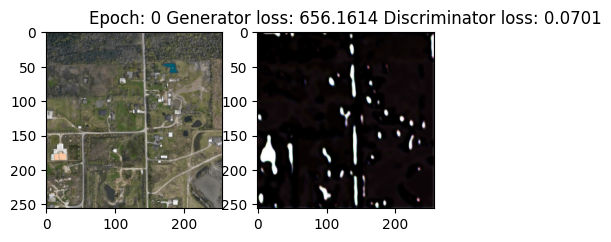

inside batch 471
inside batch 472
inside batch 473
inside batch 474
inside batch 475
inside batch 476
inside batch 477
inside batch 478
inside batch 479
inside batch 480


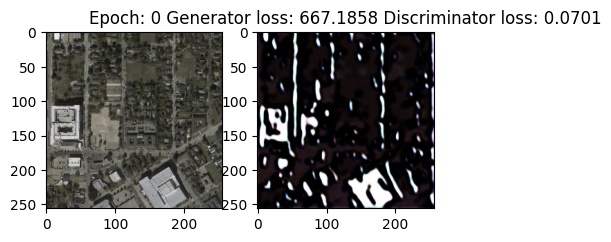

inside batch 481
inside batch 482
inside batch 483
inside batch 484
inside batch 485
inside batch 486
inside batch 487
inside batch 488
inside batch 489
inside batch 490


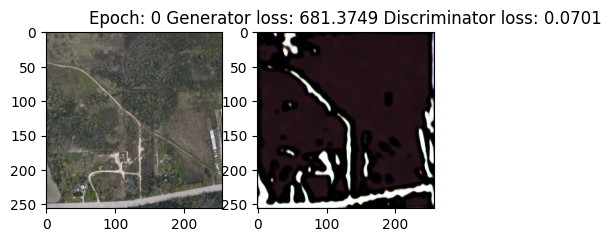

inside batch 491
inside batch 492
inside batch 493
inside batch 494
inside batch 495
inside batch 496
inside batch 497
inside batch 498
inside batch 499
inside batch 500


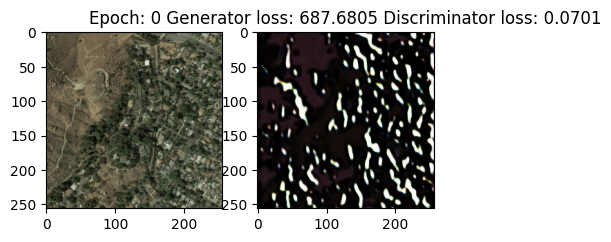

inside batch 501
inside batch 502
inside batch 503
inside batch 504
inside batch 505
inside batch 506
inside batch 507
inside batch 508
inside batch 509
inside batch 510


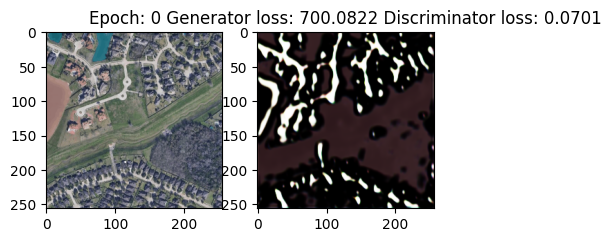

inside batch 511
inside batch 512
inside batch 513
inside batch 514
inside batch 515
inside batch 516
inside batch 517
inside batch 518
inside batch 519
inside batch 520


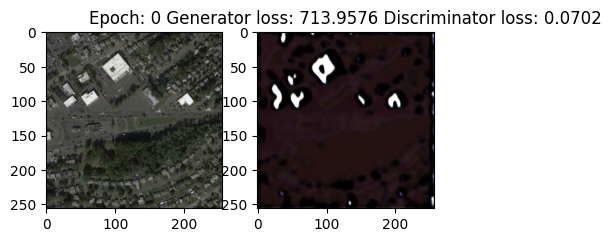

inside batch 521
inside batch 522
inside batch 523
inside batch 524
inside batch 525
inside batch 526
inside batch 527
inside batch 528
inside batch 529
inside batch 530


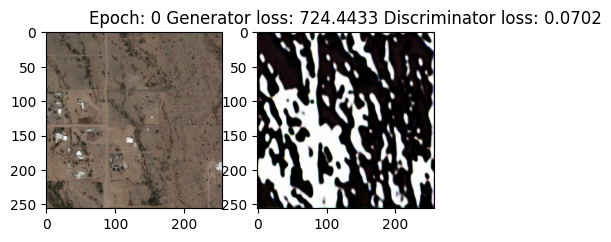

inside batch 531
inside batch 532
inside batch 533
inside batch 534
inside batch 535
inside batch 536
inside batch 537
inside batch 538
inside batch 539
inside batch 540


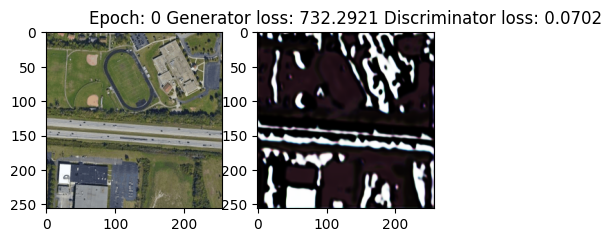

inside batch 541


KeyboardInterrupt: 

In [96]:
G.to(device)
D.to(device)
try:
  for i in range(epochs):
    print(f'\nepoch {i}\n')
    G_loss_acc = 0.0
    D_loss_acc = 0.0
    G.train()
    D.train()
    for batch_idx, (left_images, right_images) in enumerate(dataloader):
        print(f'inside batch {batch_idx}')

        left_images = left_images.to(device)
        right_images = right_images.to(device)

        right_fake = G(left_images)

        right_fake_detached = right_fake.detach()

        G_loss = generator_loss(D(torch.cat((left_images, right_fake), dim=1)), right_fake, right_images)

        G_optimizer.zero_grad()
        G_loss.backward()
        G_optimizer.step()

        real = torch.cat((left_images, right_images), dim=1)
        fake = torch.cat((left_images, right_fake_detached), dim=1)
        D_loss = discriminator_loss(D(real), D(fake))

        D_optimizer.zero_grad()
        D_loss.backward()
        D_optimizer.step()

        G_loss_acc += G_loss.item() * len(left_images)
        D_loss_acc += D_loss.item() * len(left_images)

        if batch_idx % 10 == 0:
            satelite_image = denormalize(left_images[-1])
            map_image = denormalize(right_fake_detached[-1])
            fig = plt.figure(figsize=(5, 5))
            ax1 = fig.add_subplot(121)
            ax2 = fig.add_subplot(122)
            satelite_image = satelite_image.permute(1, 2, 0).cpu().numpy()
            map_image = map_image.permute(1, 2, 0).cpu().numpy()
            ax1.imshow(satelite_image)
            ax2.imshow(map_image)
            plt.title(
                f"Epoch: {i} Generator loss: {G_loss_acc / len(dataloader) :.4f} Discriminator loss: {D_loss_acc / len(dataloader) :.4f}"
            )
            plt.show()
except NameError as e:
  print(e)

In [79]:
!nvidia-smi

Mon Jun  3 19:31:46 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   69C    P0              33W /  70W |  14487MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--